# The random forest model from the Scikit library

## Import libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve,classification_report
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
import os


## Import data set

In [3]:
# Get the absolute path to the file
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)  # Go up one directory
file_path = os.path.join(parent_dir, "output_csv_files", "ward_temporal_analysis.csv")

# Load and prepare data
df = pd.read_csv(file_path, parse_dates=['Month'])
df['Month'] = pd.to_datetime(df['Month'], errors='coerce')
df = df.dropna()

# Extract year and numeric month
df['Year'] = df['Month'].dt.year
df['Month_Num'] = df['Month'].dt.month

# Rename columns to remove spaces
df = df.rename(columns={'Ward ID': 'Ward_ID'})

# Create lag features
def create_lag_features(df, lag_periods=[1, 2, 3]):
    """
    Create lag features for crime density
    Parameters:
    -----------
    df : pandas DataFrame
        Input dataframe with time series data
    lag_periods : list
        List of lag periods to create
    Returns:
    --------
    pandas DataFrame with added lag features
    """
    # Sort the dataframe by Ward_ID, Year, and Month_Num
    df = df.sort_values(['Ward_ID', 'Year', 'Month_Num'])
    
    # Create lag features for each ward separately
    for ward in df['Ward_ID'].unique():
        ward_mask = df['Ward_ID'] == ward
        for lag in lag_periods:
            df.loc[ward_mask, f'Crime_Density_Lag_{lag}'] = df.loc[ward_mask, 'Monthly_Crime_Density'].shift(lag)# for each lag period, shifting the crime density values by that many periods.
    
    return df

# Create lag features
df_with_lags = create_lag_features(df)

# Encode Ward_ID
le = LabelEncoder()
df_with_lags['Ward_ID_Encoded'] = le.fit_transform(df_with_lags['Ward_ID'])

# Binning target variable into 3 categories (low, mid, high crime density)
df_with_lags['Crime_Density_Level'] = pd.qcut(df_with_lags['Monthly_Crime_Density'], q=3, labels=[0, 1, 2])

# Defining the features
lag_features = [f'Crime_Density_Lag_{lag}' for lag in [1, 2, 3]]
features = ['Ward_ID_Encoded', 'Year', 'Month_Num'] + lag_features
target = 'Crime_Density_Level'

# Train-test split
df_train = df_with_lags[df_with_lags['Year'] <= 2024]
df_test = df_with_lags[df_with_lags['Year'] > 2024]

# Drop rows with NaN values in any of the features
df_train = df_train.dropna(subset=features + [target])
df_test = df_test.dropna(subset=features + [target])

X_train = df_train[features]
y_train = df_train[target].astype(int)
X_test = df_test[features]
y_test = df_test[target].astype(int)

## The RandomForestClassifier and ROC curve

Accuracy: 0.6505
Overall ROC AUC Score: 0.8295665654808803
Confusion Matrix:
 [[238 140  15]
 [ 81 249 120]
 [  8  60 302]]
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.61      0.66       393
           1       0.55      0.55      0.55       450
           2       0.69      0.82      0.75       370

    accuracy                           0.65      1213
   macro avg       0.66      0.66      0.65      1213
weighted avg       0.65      0.65      0.65      1213


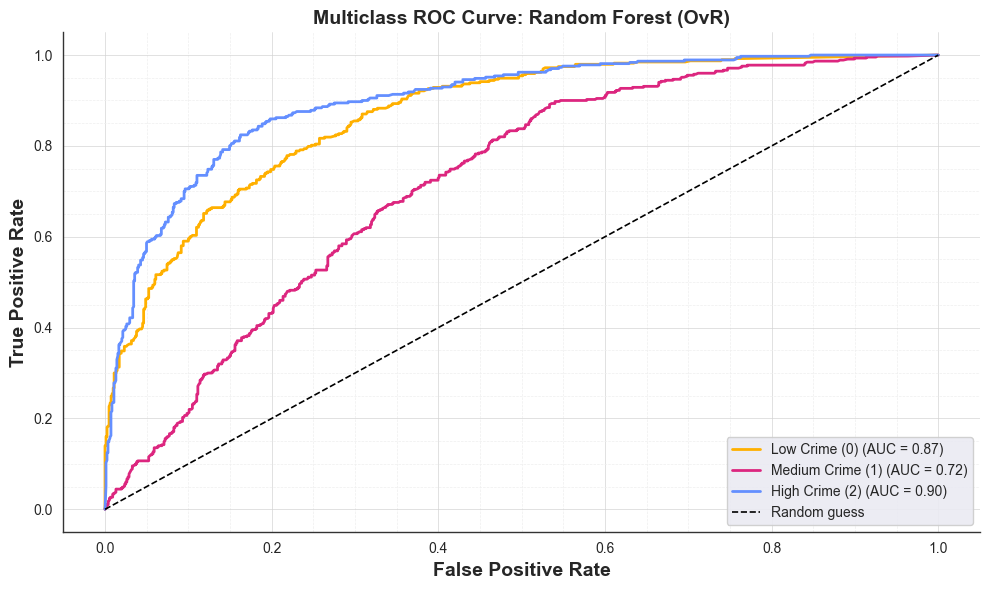

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc  # <- do not overwrite this!
)

# Binarize labels for ROC AUC (required for multiclass)
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

# Wrap RandomForest in One-vs-Rest strategy
base_model = RandomForestClassifier(n_estimators=100, random_state=0)
rdm_forest_ovr = OneVsRestClassifier(base_model)
rdm_forest_ovr.fit(X_train, y_train)

# Predict class probabilities
y_pred_prob = rdm_forest_ovr.predict_proba(X_test)

# Predict final class
y_pred = rdm_forest_ovr.predict(X_test)

# Evaluate
accuracy = accuracy_score(y_test, y_pred)
try:
    overall_auc = roc_auc_score(y_test_bin, y_pred_prob, multi_class='ovr')
except ValueError:
    overall_auc = "Cannot compute AUC (check label binarization)"

conf_matrix = confusion_matrix(y_test, y_pred)

# Output results
print(f"Accuracy: {accuracy:.4f}")
print("Overall ROC AUC Score:", overall_auc)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", classification_report(y_test, y_pred))

# ----------------------------
# Multiclass ROC Curve Plot
# ----------------------------

# Define class labels and colors
classes = [0, 1, 2]
class_labels = ['Low Crime (0)', 'Medium Crime (1)', 'High Crime (2)']
colors = ['#FFB000', '#DC267F', '#648FFF']

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])  # ✅ this uses the correct auc function

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
ax.grid(True, which='major', linestyle='-', linewidth=0.5, color='#d4d4d4', zorder=0)
ax.grid(True, which='minor', linestyle='--', linewidth=0.5, color='#efefef', zorder=0)

for i, color in zip(range(len(classes)), colors):
    ax.plot(fpr[i], tpr[i], color=color, lw=2,
            label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

# Diagonal reference line
ax.plot([0, 1], [0, 1], 'k--', lw=1.2, label='Random guess')

# Axis styling
ax.set_xlabel("False Positive Rate", fontsize=14, fontweight='bold')
ax.set_ylabel("True Positive Rate", fontsize=14, fontweight='bold')
ax.set_title("Multiclass ROC Curve: Random Forest (OvR)", fontsize=14, fontweight='bold')
ax.legend(loc="lower right", framealpha=0.9, edgecolor='#CCCCCC')

# Ticks & spines
ax.set_xticks(np.arange(0, 1.1, 0.2))
ax.set_yticks(np.arange(0, 1.1, 0.2))
ax.tick_params(axis='both', which='major', labelsize=10, direction='out', length=4, width=1)
ax.set_xticks(np.arange(0, 1.05, 0.05), minor=True)
ax.set_yticks(np.arange(0, 1.05, 0.05), minor=True)
ax.tick_params(axis='both', which='minor', direction='out', length=2, width=1, labelsize=0)

for side in ['top', 'right']:
    ax.spines[side].set_visible(False)
for side in ['left', 'bottom']:
    ax.spines[side].set_linewidth(1.0)
    ax.spines[side].set_color('#333333')

ax.set_facecolor('white')
fig.tight_layout()
plt.show()


## Visualise random forest

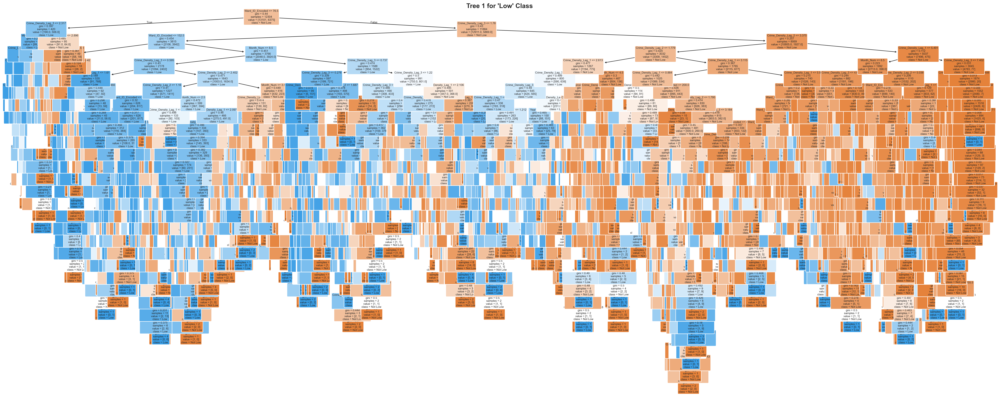

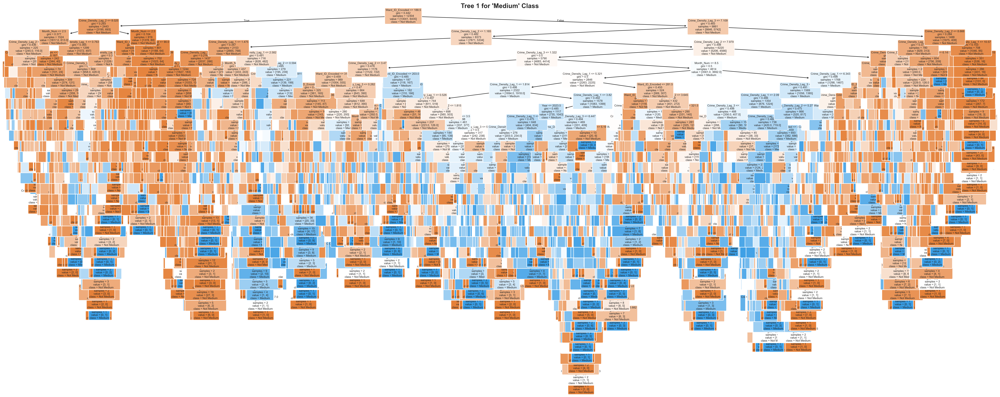

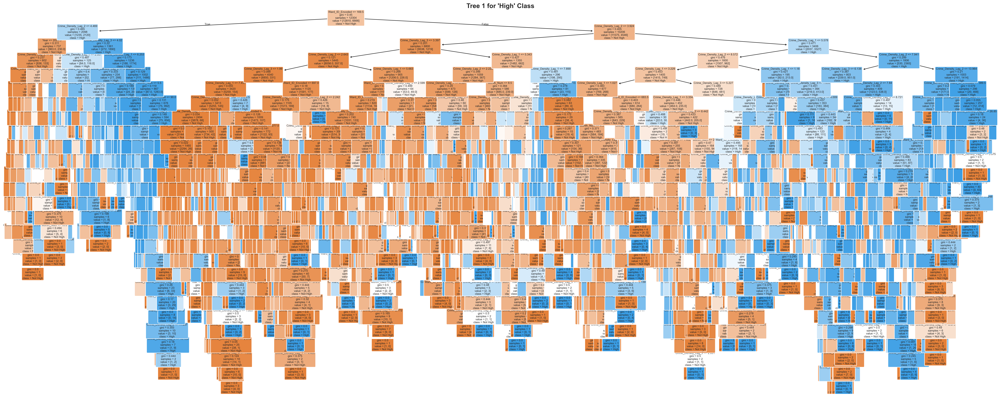

In [5]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

label_names = ["Low", "Medium", "High"]

# Each estimator in OvR corresponds to one binary classifier (e.g., "Low" vs not "Low")
for i in range(3):
    estimator = rdm_forest_ovr.estimators_[i]  # This is a RandomForestClassifier

    # Extract the first tree from the RandomForestClassifier within OvR
    tree = estimator.estimators_[0]  # This is a DecisionTreeClassifier

    plt.figure(figsize=(30, 12), dpi=300)
    plot_tree(
        tree,
        feature_names=X_train.columns,
        class_names=[f"Not {label_names[i]}", label_names[i]],
        filled=True,
        rounded=True,
        fontsize=6
    )
    plt.title(f"Tree 1 for '{label_names[i]}' Class", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()


# Cross-Validation with 5 Folds

In [6]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(base_model, X_train, y_train, cv=5)#default for scoring is accuracy.
print(f"Accuracy Cross-Validation Scores: {scores}")

Accuracy Cross-Validation Scores: [0.48485626 0.41720154 0.46136072 0.54120668 0.37252888]
